<a href="https://colab.research.google.com/github/AI-fanatic24/Breast-Cancer-Classification/blob/Diagnostic-model/Diagnostic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import LabelEncoder

In [ ]:
pip install ucimlrepo

In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17)

# data (as pandas dataframes)
X = breast_cancer_wisconsin_diagnostic.data.features
y = breast_cancer_wisconsin_diagnostic.data.targets

# metadata
print(breast_cancer_wisconsin_diagnostic.metadata)

# variable information
print(breast_cancer_wisconsin_diagnostic.variables)


{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'ID': 230, 'type': 'NATIVE', 'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'venue': 'Electronic imaging', 'year': 1993, 'journal': None, 'DOI': '1

In [ ]:
df = pd.concat([X,y],axis=1)
df

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,M
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,M
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,M
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,M
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

In [ ]:
df.describe()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


**CHECKING PRESENCE OF NULL VALUES**

In [ ]:
#checking presence of null values
df.isnull().sum()

,0
radius1,0
texture1,0
perimeter1,0
area1,0
smoothness1,0
compactness1,0
concavity1,0
concave_points1,0
symmetry1,0
fractal_dimension1,0


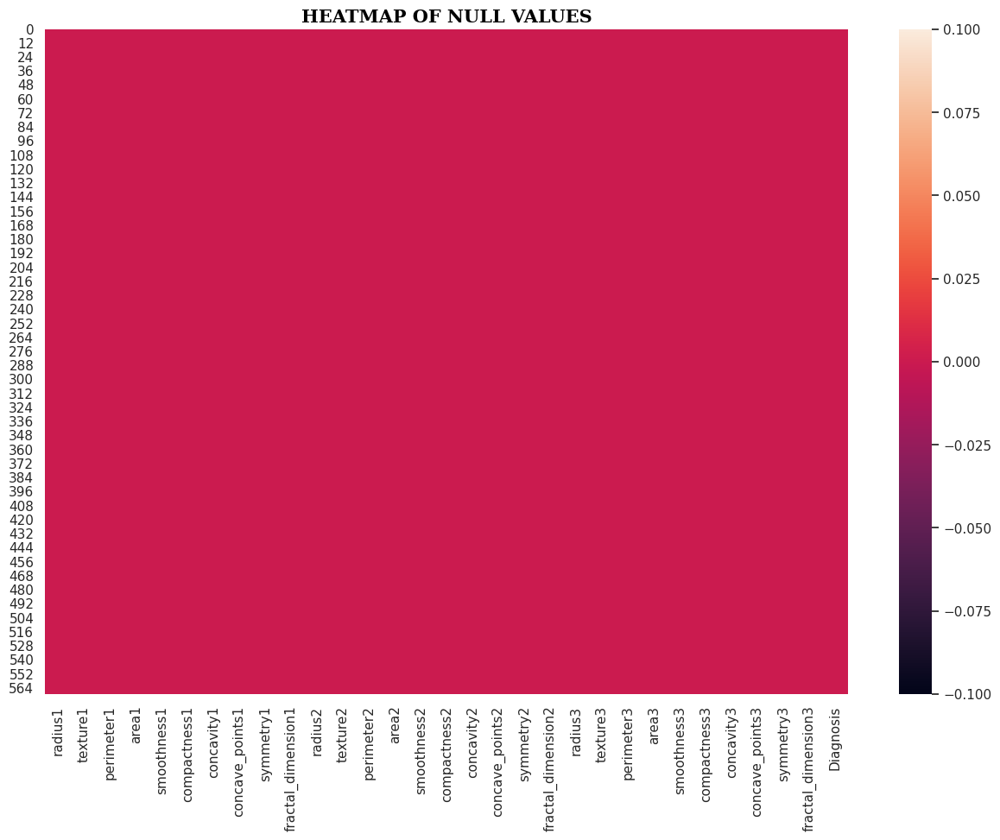

In [ ]:
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(df.isnull())
plt.title("HEATMAP OF NULL VALUES",fontdict={'family':'serif','fontsize':15,'color':'black','fontweight':'bold'})
plt.show()

**VISUALIZING OUTLIERS**

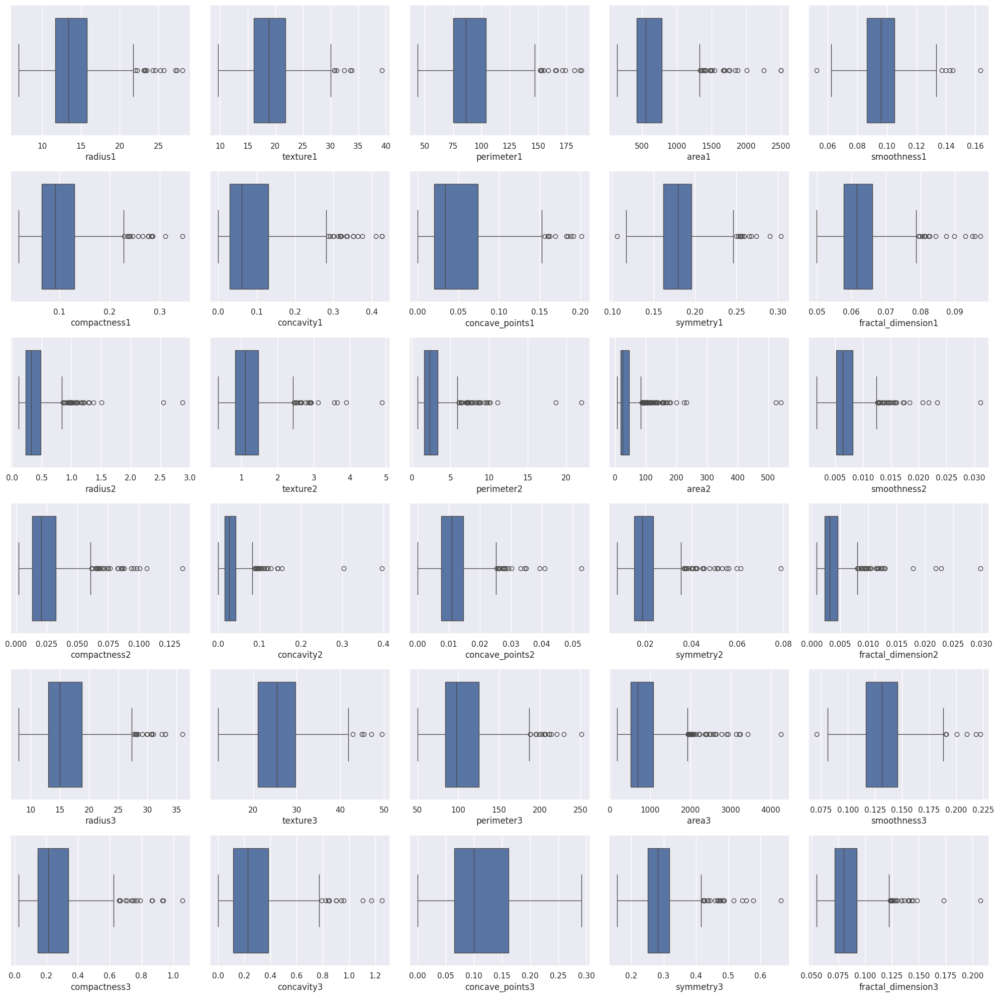

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
for i in range(len(df.columns[:-1])):
  plt.subplot(6,5,(i+1))
  sns.boxplot(x=df.iloc[:,i])

plt.tight_layout()

plt.show()

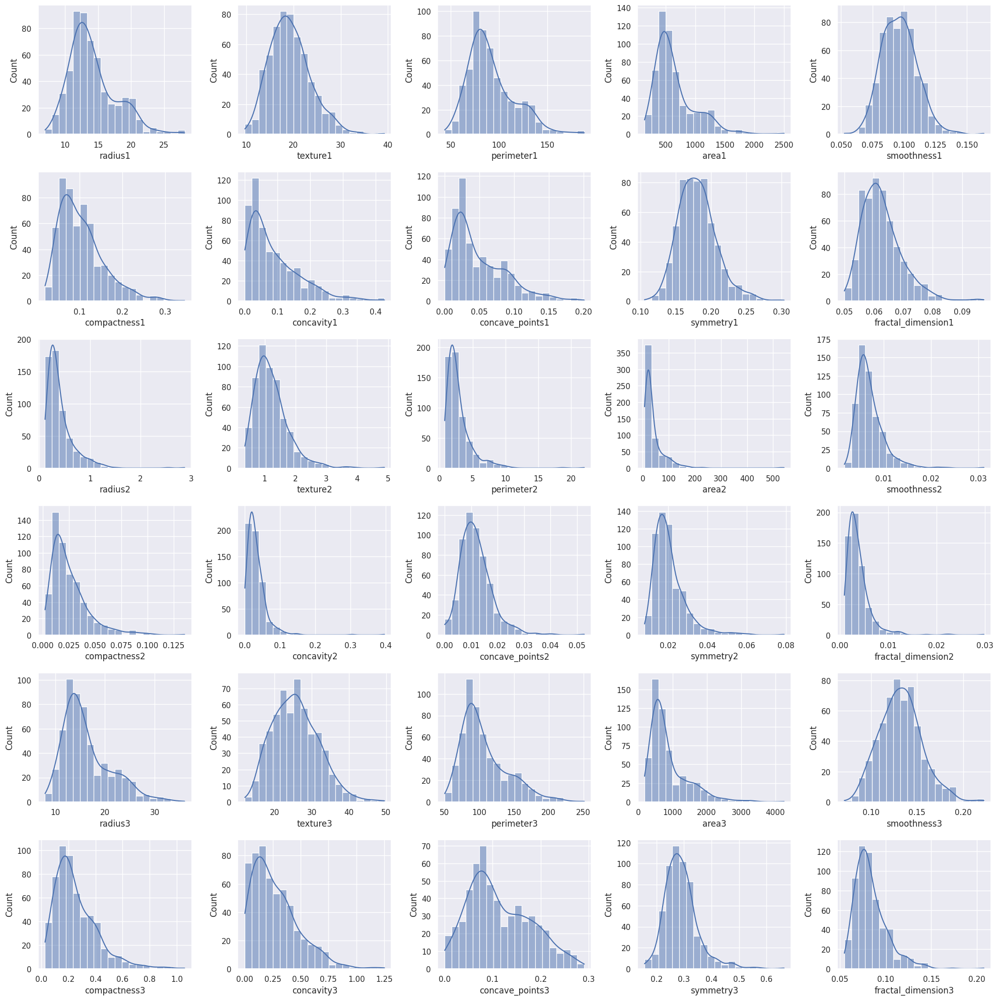

In [ ]:
sns.set(rc={'figure.figsize':(20,20)})
for i in range(len(df.columns[:-1])):
  plt.subplot(6,5,(i+1))
  sns.histplot(x=df.iloc[:,i],bins=20,kde=True)

plt.tight_layout()

plt.show()

In [ ]:
columns = df.columns
print("----MEDIAN OF FEATURES----")
for i in range(len(df.columns[:-1])):
  print(columns[i],":",df.iloc[:,i].median())

----MEDIAN OF FEATURES----
radius1 : 13.37
texture1 : 18.84
perimeter1 : 86.24
area1 : 551.1
smoothness1 : 0.09587
compactness1 : 0.09263
concavity1 : 0.06154
concave_points1 : 0.0335
symmetry1 : 0.1792
fractal_dimension1 : 0.06154
radius2 : 0.3242
texture2 : 1.108
perimeter2 : 2.287
area2 : 24.53
smoothness2 : 0.00638
compactness2 : 0.02045
concavity2 : 0.02589
concave_points2 : 0.01093
symmetry2 : 0.01873
fractal_dimension2 : 0.003187
radius3 : 14.97
texture3 : 25.41
perimeter3 : 97.66
area3 : 686.5
smoothness3 : 0.1313
compactness3 : 0.2119
concavity3 : 0.2267
concave_points3 : 0.09993
symmetry3 : 0.2822
fractal_dimension3 : 0.08004


NOW, LABEL ENCODING THE TARGET VARIABLE

In [ ]:
#Label Encoding as:
# 1 = Malignant
# 0 = Benign

le = LabelEncoder()
df['Diagnosis'] = le.fit_transform(df['Diagnosis'])
df

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,1
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,1
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,1
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,1
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,1
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,1
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,1
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,1


In [ ]:
df['Diagnosis'].value_counts()

,count
Diagnosis,
0,357
1,212


In [ ]:
fontdict = {'family':'serif','fontsize':10,'color':'black','fontweight':'bold'}

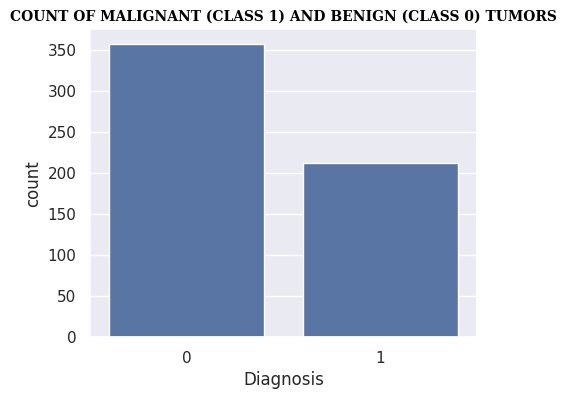

In [ ]:
sns.set(rc={'figure.figsize':(5,4)})
sns.countplot(df,x='Diagnosis')
plt.title("COUNT OF MALIGNANT (CLASS 1) AND BENIGN (CLASS 0) TUMORS",fontdict=fontdict)
plt.show()

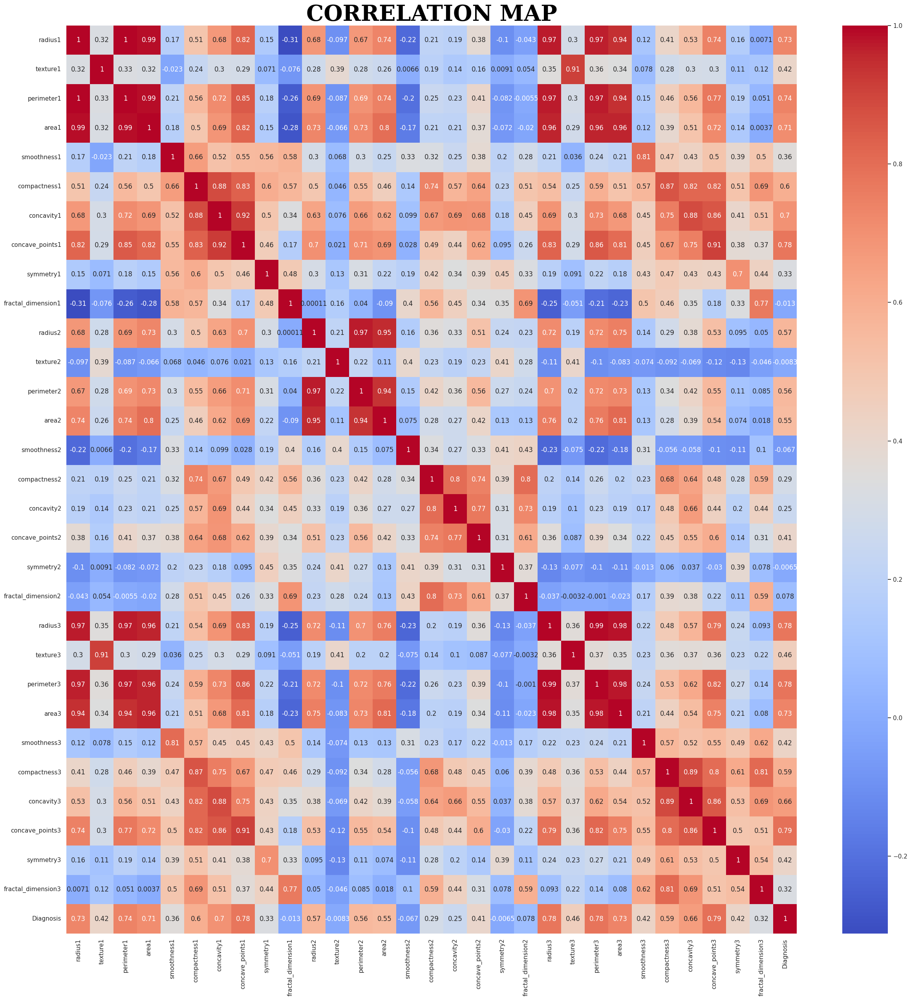

In [ ]:
sns.set(rc={'figure.figsize':(30,30)})
corr = df.corr()
sns.heatmap(corr,annot=True,cmap='coolwarm')
plt.title("CORRELATION MAP",fontdict={'family':'serif','fontsize':40,'color':'black','fontweight':'bold'})
plt.show()

In [ ]:
df.columns

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3', 'Diagnosis'],
      dtype='object')

**VISUALIZING TRENDS OF DIAGNOSIS ACROSS VARIOUS FEATURES**

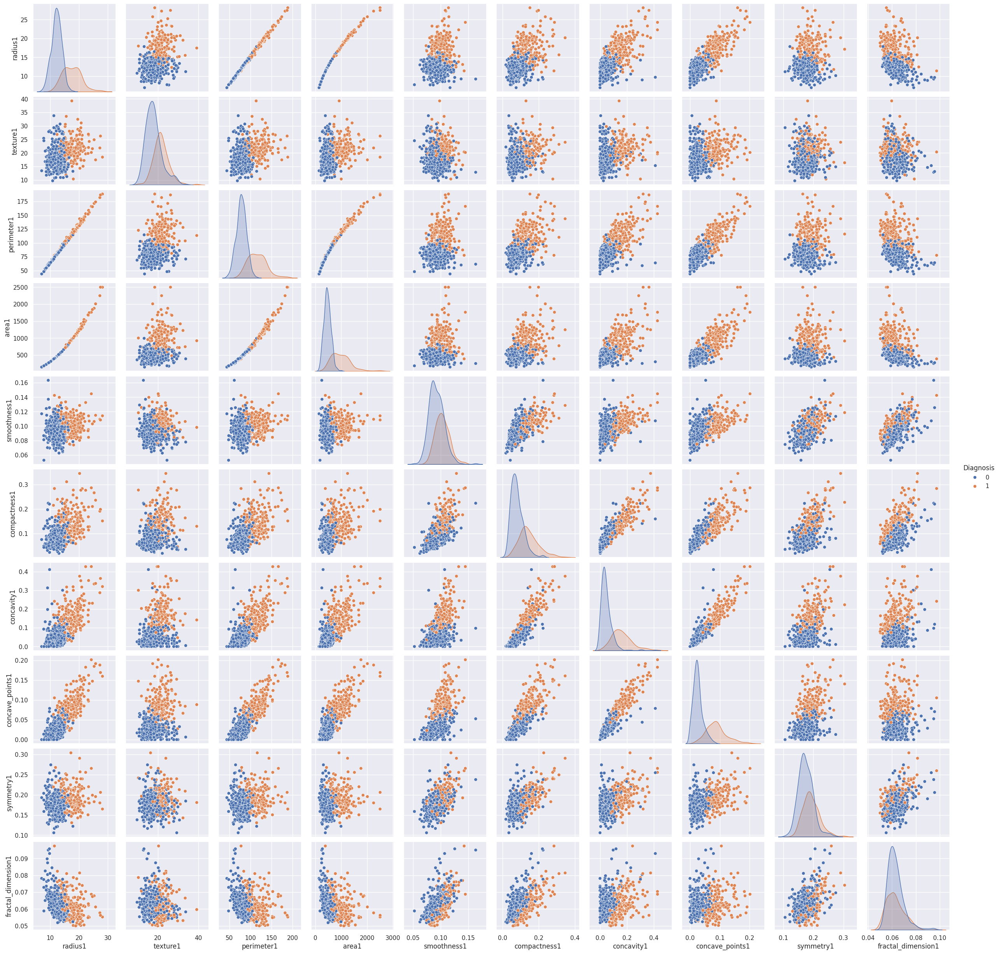

In [ ]:
sns.set(rc={'figure.figsize':(40,40)})
sns.pairplot(df[['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1','compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1','Diagnosis']],hue='Diagnosis')
plt.show()

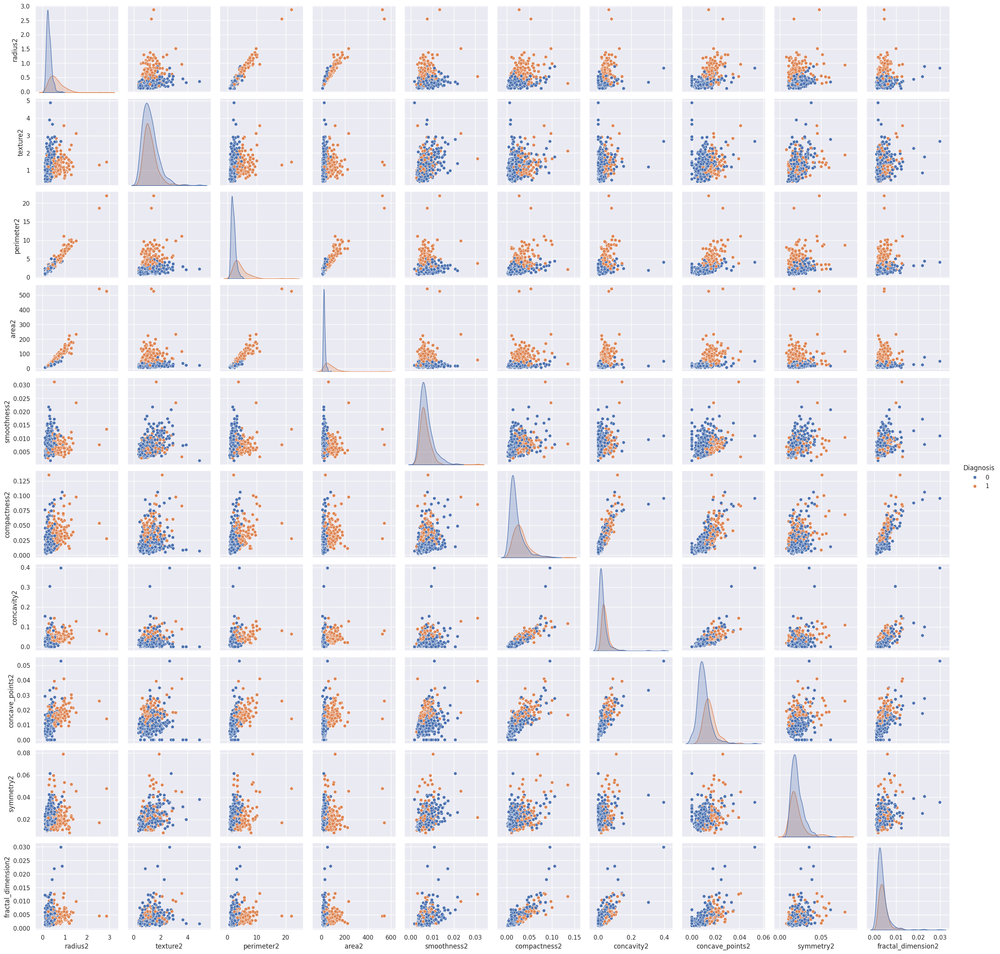

In [ ]:
sns.set(rc={'figure.figsize':(40,40)})
sns.pairplot(df[['radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2','Diagnosis']],hue='Diagnosis')
plt.show()

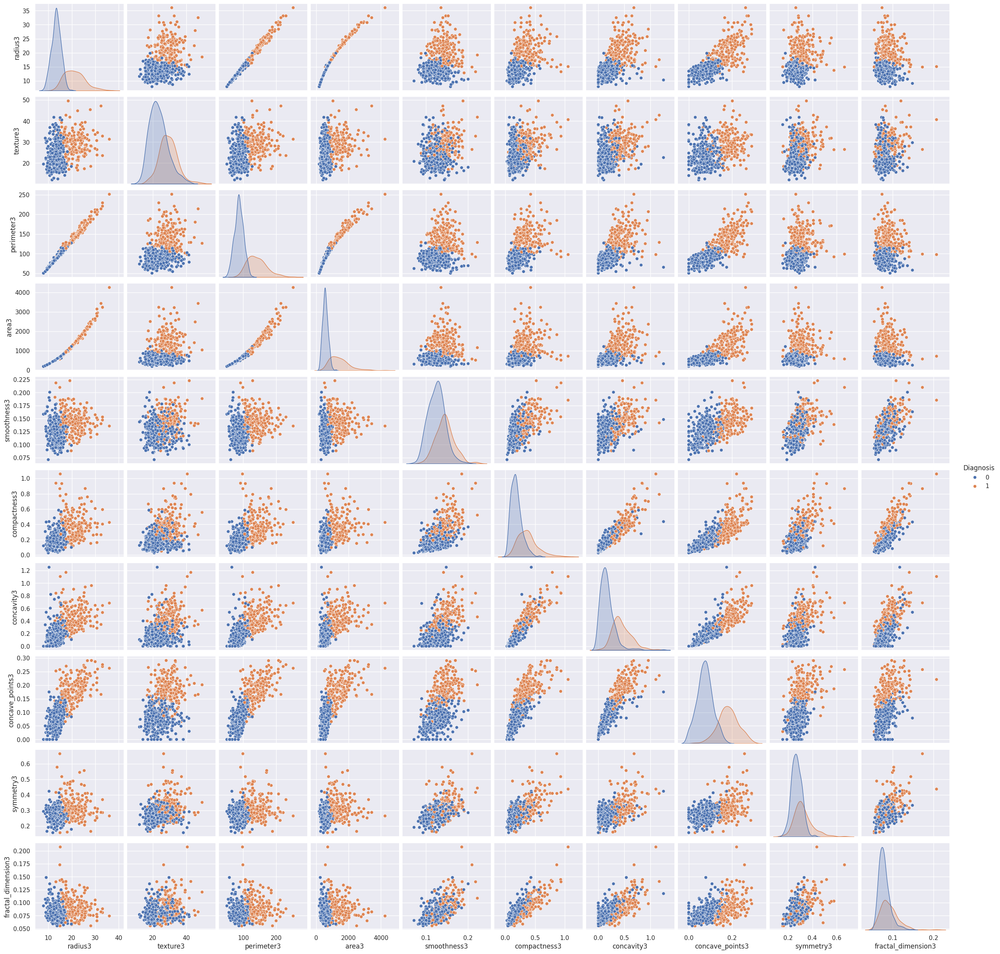

In [ ]:
sns.set(rc={'figure.figsize':(40,40)})
sns.pairplot(df[['radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3','Diagnosis']],hue='Diagnosis')
plt.show()

In [ ]:
df.to_csv('breast_cancer_preprocessed.csv',index=False)

In [ ]:
features = df.columns[:-1]
features

Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3'],
      dtype='object')

In [ ]:
target = df.columns[-1]
target

'Diagnosis'

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV,StratifiedKFold
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE

**SPLITTING THE DATA INTO 80% TRAINING DATA AND 20% TESTING DATA**

In [ ]:
X_train,X_test,y_train,y_test = train_test_split(df[features],df[target],test_size=0.20,random_state=23)
print("X_train",X_train.shape)
print("X_test",X_test.shape)
print("y_train",y_train.shape)
print("y_test",y_test.shape)

X_train (455, 30)
X_test (114, 30)
y_train (455,)
y_test (114,)


In [ ]:
train = pd.concat([X_train,y_train],axis=1)
train

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,Diagnosis
115,11.930,21.53,76.53,438.6,0.09768,0.07849,0.03328,0.02008,0.1688,0.06194,...,26.15,87.54,583.0,0.15000,0.23990,0.15030,0.07247,0.2438,0.08541,0
108,22.270,19.67,152.80,1509.0,0.13260,0.27680,0.42640,0.18230,0.2556,0.07039,...,28.01,206.80,2360.0,0.17010,0.69970,0.96080,0.29100,0.4055,0.09789,1
470,9.667,18.49,61.49,289.1,0.08946,0.06258,0.02948,0.01514,0.2238,0.06413,...,25.62,70.88,385.2,0.12340,0.15420,0.12770,0.06560,0.3174,0.08524,0
476,14.200,20.53,92.41,618.4,0.08931,0.11080,0.05063,0.03058,0.1506,0.06009,...,27.26,112.10,828.5,0.11530,0.34290,0.25120,0.13390,0.2534,0.07858,0
270,14.290,16.82,90.30,632.6,0.06429,0.02675,0.00725,0.00625,0.1508,0.05376,...,20.65,94.44,684.6,0.08567,0.05036,0.03866,0.03333,0.2458,0.06120,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460,17.080,27.15,111.20,930.9,0.09898,0.11100,0.10070,0.06431,0.1793,0.06281,...,34.49,152.10,1648.0,0.16000,0.24440,0.26390,0.15550,0.3010,0.09060,1
237,20.480,21.46,132.50,1306.0,0.08355,0.08348,0.09042,0.06022,0.1467,0.05177,...,26.17,161.70,1750.0,0.12280,0.23110,0.31580,0.14450,0.2238,0.07127,1
31,11.840,18.70,77.93,440.6,0.11090,0.15160,0.12180,0.05182,0.2301,0.07799,...,28.12,119.40,888.7,0.16370,0.57750,0.69560,0.15460,0.4761,0.14020,1
488,11.680,16.17,75.49,420.5,0.11280,0.09263,0.04279,0.03132,0.1853,0.06401,...,21.59,86.57,549.8,0.15260,0.14770,0.14900,0.09815,0.2804,0.08024,0


**CHECKING IMBALANCE IN TRAINING DATA**

In [ ]:
train['Diagnosis'].value_counts()

,count
Diagnosis,
0,282
1,173


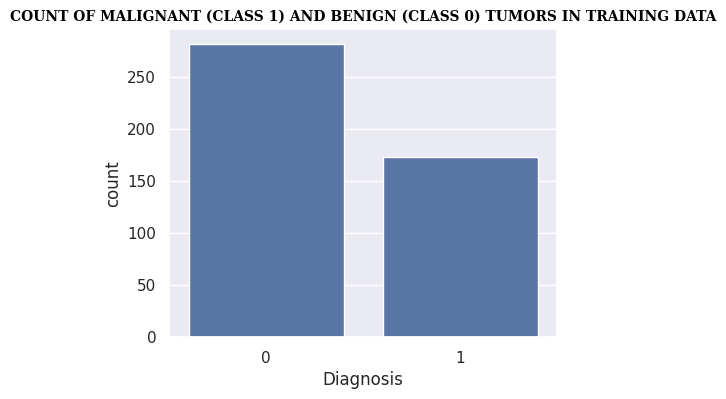

In [ ]:
sns.set(rc={'figure.figsize':(5,4)})
sns.countplot(train,x='Diagnosis')
plt.title("COUNT OF MALIGNANT (CLASS 1) AND BENIGN (CLASS 0) TUMORS IN TRAINING DATA",fontdict=fontdict)
plt.show()

**HANDLING IMBALANCE IN TRAINING DATA THROUGH SMOTE**

In [ ]:
smote = SMOTE()

In [ ]:
np.random.seed(123)
X_train,y_train = smote.fit_resample(X_train,y_train)

In [ ]:
print(X_train.shape)
print(y_train.shape)

(564, 30)
(564,)


In [ ]:
X_train

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,11.930000,21.530000,76.530000,438.600000,0.097680,0.078490,0.033280,0.020080,0.168800,0.061940,...,13.670000,26.150000,87.540000,583.000000,0.150000,0.239900,0.150300,0.072470,0.243800,0.085410
1,22.270000,19.670000,152.800000,1509.000000,0.132600,0.276800,0.426400,0.182300,0.255600,0.070390,...,28.400000,28.010000,206.800000,2360.000000,0.170100,0.699700,0.960800,0.291000,0.405500,0.097890
2,9.667000,18.490000,61.490000,289.100000,0.089460,0.062580,0.029480,0.015140,0.223800,0.064130,...,11.140000,25.620000,70.880000,385.200000,0.123400,0.154200,0.127700,0.065600,0.317400,0.085240
3,14.200000,20.530000,92.410000,618.400000,0.089310,0.110800,0.050630,0.030580,0.150600,0.060090,...,16.450000,27.260000,112.100000,828.500000,0.115300,0.342900,0.251200,0.133900,0.253400,0.078580
4,14.290000,16.820000,90.300000,632.600000,0.064290,0.026750,0.007250,0.006250,0.150800,0.053760,...,14.910000,20.650000,94.440000,684.600000,0.085670,0.050360,0.038660,0.033330,0.245800,0.061200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
559,18.732149,21.755669,123.844981,1103.472754,0.101156,0.124673,0.160143,0.094658,0.168130,0.060792,...,21.065703,28.621085,140.248996,1376.825285,0.135146,0.229150,0.319323,0.157750,0.233352,0.078652
560,20.857803,21.093678,139.711345,1366.058108,0.112915,0.176855,0.266523,0.132173,0.199686,0.060952,...,27.780011,29.657563,195.318723,2381.814425,0.159250,0.478858,0.717627,0.261034,0.331618,0.085410
561,15.753141,23.950000,103.724836,769.934501,0.092526,0.121757,0.125115,0.061478,0.183707,0.057714,...,16.907056,29.813247,113.415629,884.670913,0.128026,0.267975,0.321335,0.137828,0.285966,0.073755
562,17.770579,27.438757,117.387064,983.610384,0.099980,0.131202,0.165621,0.082510,0.174490,0.059287,...,21.530000,37.552221,145.241702,1436.129361,0.139372,0.364842,0.609388,0.193193,0.299408,0.089602


In [ ]:
y_train_df = pd.DataFrame(y_train)
y_train_df

,Diagnosis
0,0
1,1
2,0
3,0
4,0
...,...
559,1
560,1
561,1
562,1


In [ ]:
labels,values = np.unique(y_train,return_counts=True)
print(labels)
print(values)

[0 1]
[282 282]


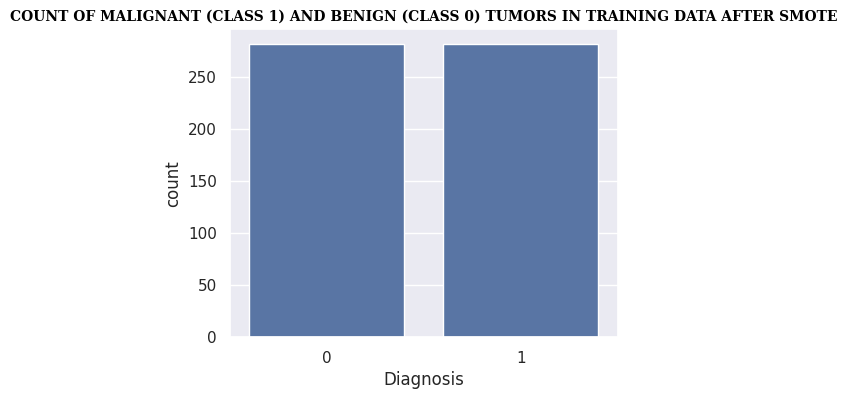


CLASS 0: 282
CLASS 1: 282


In [ ]:
sns.set(rc={'figure.figsize':(5,4)})
sns.countplot(y_train_df,x='Diagnosis')
plt.title("COUNT OF MALIGNANT (CLASS 1) AND BENIGN (CLASS 0) TUMORS IN TRAINING DATA AFTER SMOTE",fontdict=fontdict)
plt.show()
print()
print("CLASS 0:",values[0])
print("CLASS 1:",values[1])

**NORMALIZING THE DATA**

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled

In [ ]:
X_train.shape

(564, 30)

In [ ]:
train_data = pd.DataFrame(X_train_scaled)
train_data

In [ ]:
train_data.to_csv('X_train.csv',index=False)

In [ ]:
y_train_df = pd.DataFrame(y_train)
y_train_df

In [ ]:
y_train_df.to_csv('y_train.csv',index=False)

In [ ]:
X_test_scaled = scaler.transform(X_test)
X_test_scaled

In [ ]:
X_test_scaled.shape

(114, 30)

In [ ]:
X_test_scaled_df = pd.DataFrame(X_test_scaled)
X_test_scaled_df

In [ ]:
X_test_scaled_df.to_csv('X_test.csv',index=False)

In [ ]:
y_test_df = pd.DataFrame(y_test)

In [ ]:
y_test_df.to_csv('y_test.csv',index=False)

In [ ]:
y_test_df.value_counts()

,count
Diagnosis,
0,75
1,39


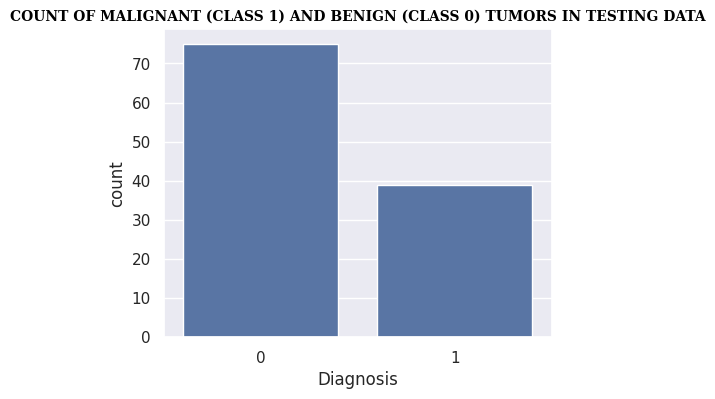

In [ ]:
sns.countplot(y_test_df,x='Diagnosis')
plt.title("COUNT OF MALIGNANT (CLASS 1) AND BENIGN (CLASS 0) TUMORS IN TESTING DATA",fontdict=fontdict)
plt.show()

**LOGISTIC REGRESSION MODEL**

In [ ]:
model = LogisticRegression(random_state=12)
param_grid = {'penalty':['l1', 'l2', 'elasticnet',None],'C':[0.001,0.01,0.1,1,10,20,40,60,80,100],'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']}

In [ ]:
model

LogisticRegression(random_state=12)

In [ ]:
model.fit(X_train_scaled,y_train)
prediction = model.predict(X_train_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [ ]:
print(accuracy_score(y_train,prediction))

0.9858156028368794


In [ ]:
print(confusion_matrix(y_train,prediction))

[[281   1]
 [  7 275]]


In [ ]:
prediction = model.predict(X_test_scaled)
prediction

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print(accuracy_score(y_test,prediction))

0.9736842105263158


In [ ]:
print(confusion_matrix(y_test,prediction))

[[73  2]
 [ 1 38]]


In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
grid = GridSearchCV(estimator=model,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}

In [ ]:
grid.best_score_

np.float64(0.9751738305941846)

In [ ]:
best_model = grid.best_estimator_
best_model

LogisticRegression(C=0.1, random_state=12)

In [ ]:
print("Training Accuracy")
print(accuracy_score(y_train,best_model.predict(X_train_scaled)))

Training Accuracy
0.9858156028368794


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,best_model.predict(X_train_scaled)))

Training Confusion Matrix
[[281   1]
 [  7 275]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,best_model.predict(X_train_scaled)))

Training Classification Report
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       282
           1       1.00      0.98      0.99       282

    accuracy                           0.99       564
   macro avg       0.99      0.99      0.99       564
weighted avg       0.99      0.99      0.99       564



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print("Testing Accuracy")
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.9824561403508771


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[74  1]
 [ 1 38]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99        75
           1       0.97      0.97      0.97        39

    accuracy                           0.98       114
   macro avg       0.98      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



SAVING THE LOGISTIC REGRESSION MODEL

In [ ]:
import joblib

In [ ]:
joblib.dump(best_model, 'logistic_regression_model.joblib')

['logistic_regression_model.joblib']

In [ ]:
loaded_model_logistic = joblib.load('logistic_regression_model.joblib')

**RANDOM FOREST**

In [ ]:
classifier = RandomForestClassifier(random_state=14)
param_grid = {'n_estimators':[20,40,60,80,100],'criterion':['gini', 'entropy', 'log_loss'],'max_depth':[1,2,3,4,None],'min_samples_split':[3,5],'min_samples_leaf':[2,3,5],'max_features':['sqrt', 'log2', None]}

In [ ]:
classifier.fit(X_train_scaled,y_train)
prediction = classifier.predict(X_train_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [ ]:
print(accuracy_score(y_train,prediction))

1.0


In [ ]:
print(confusion_matrix(y_train,prediction))

[[282   0]
 [  0 282]]


In [ ]:
prediction = classifier.predict(X_test_scaled)
prediction

array([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print(accuracy_score(y_test,prediction))

0.9736842105263158


In [ ]:
print(confusion_matrix(y_test,prediction))

[[74  1]
 [ 2 37]]


In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
grid = GridSearchCV(estimator=classifier,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'criterion': 'entropy',
 'max_depth': 4,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 60}

In [ ]:
grid.best_score_

np.float64(0.9663242730720608)

In [ ]:
best_model = grid.best_estimator_
best_model

RandomForestClassifier(criterion='entropy', max_depth=4, max_features='log2',
                       n_estimators=60, random_state=14)

In [ ]:
print("Training Accuracy")
print(accuracy_score(y_train,best_model.predict(X_train_scaled)))

Training Accuracy
0.9875886524822695


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,best_model.predict(X_train_scaled)))

Training Confusion Matrix
[[281   1]
 [  6 276]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,best_model.predict(X_train_scaled)))

Training Classification Report
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       282
           1       1.00      0.98      0.99       282

    accuracy                           0.99       564
   macro avg       0.99      0.99      0.99       564
weighted avg       0.99      0.99      0.99       564



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print("Testing Accuracy")
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.9824561403508771


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[74  1]
 [ 1 38]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.99      0.99      0.99        75
           1       0.97      0.97      0.97        39

    accuracy                           0.98       114
   macro avg       0.98      0.98      0.98       114
weighted avg       0.98      0.98      0.98       114



SAVING THE RANDOM FOREST MODEL

In [ ]:
joblib.dump(best_model, 'random_forest_model.joblib')

['random_forest_model.joblib']

In [ ]:
loaded_model_random_forest = joblib.load('random_forest_model.joblib')

**XGBOOST**

In [ ]:
from xgboost import XGBClassifier

In [ ]:
xgb = XGBClassifier(random_state=14)
xgb.fit(X_train_scaled,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=14, ...)

In [ ]:
prediction = xgb.predict(X_train_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [ ]:
print(accuracy_score(y_train,prediction))

1.0


In [ ]:
print(confusion_matrix(y_train,prediction))

[[282   0]
 [  0 282]]


In [ ]:
prediction = xgb.predict(X_test_scaled)
prediction

array([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print(accuracy_score(y_test,prediction))

0.9912280701754386


In [ ]:
print(confusion_matrix(y_test,prediction))

[[75  0]
 [ 1 38]]


In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
param_grid = {'learning_rate':[0.2,0.3,0.4,0.5],'gamma':[0,1,4],'max_depth':[2,4,6,8],'min_child_weight':[0,2,4],'subsample':[0.5,1],'lambda':[0.2,0.5,1]}

In [ ]:
grid = GridSearchCV(estimator=xgb,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'gamma': 0,
 'lambda': 0.2,
 'learning_rate': 0.2,
 'max_depth': 6,
 'min_child_weight': 0,
 'subsample': 0.5}

In [ ]:
grid.best_score_

np.float64(0.9769595448798988)

In [ ]:
best_model = grid.best_estimator_
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=0.2, learning_rate=0.2,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=0, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
print("Training Accuracy")
print(accuracy_score(y_train,best_model.predict(X_train_scaled)))

Training Accuracy
1.0


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,best_model.predict(X_train_scaled)))

Training Confusion Matrix
[[282   0]
 [  0 282]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,best_model.predict(X_train_scaled)))

Training Classification Report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       282
           1       1.00      1.00      1.00       282

    accuracy                           1.00       564
   macro avg       1.00      1.00      1.00       564
weighted avg       1.00      1.00      1.00       564



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print("Testing Accuracy")
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.9912280701754386


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[75  0]
 [ 1 38]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        75
           1       1.00      0.97      0.99        39

    accuracy                           0.99       114
   macro avg       0.99      0.99      0.99       114
weighted avg       0.99      0.99      0.99       114



SAVING THE EXTREME GRADIENT BOOSTING (XGB) MODEL

In [ ]:
joblib.dump(best_model, 'xgb_model.joblib')

['xgb_model.joblib']

In [ ]:
loaded_model_xgb = joblib.load('xgb_model.joblib')

**SVM**

In [ ]:
from sklearn.svm import SVC

In [ ]:
svm = SVC()
svm.fit(X_train_scaled,y_train)

SVC()

In [ ]:
prediction = svm.predict(X_train_scaled)
prediction

array([0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0,

In [ ]:
print(accuracy_score(y_train,prediction))

0.9840425531914894


In [ ]:
print(confusion_matrix(y_train,prediction))

[[281   1]
 [  8 274]]


In [ ]:
prediction = svm.predict(X_test_scaled)
prediction

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print(accuracy_score(y_test,prediction))

0.9824561403508771


In [ ]:
print(confusion_matrix(y_test,prediction))

[[74  1]
 [ 1 38]]


In [ ]:
param_grid = {'C':[0.5,1,1.5,2,3],'kernel':['linear', 'poly', 'rbf', 'sigmoid'],'degree':[1,2,3,4],'gamma':[0.5,1,2,'scale', 'auto']}

In [ ]:
cv = StratifiedKFold(shuffle=True)

In [ ]:
grid = GridSearchCV(estimator=svm,param_grid=param_grid,cv=cv,refit=True,verbose=3,scoring='accuracy')
grid.fit(X_train_scaled,y_train)

In [ ]:
grid.best_params_

{'C': 0.5, 'degree': 1, 'gamma': 0.5, 'kernel': 'poly'}

In [ ]:
grid.best_score_

np.float64(0.987594816687737)

In [ ]:
best_model = grid.best_estimator_
best_model

SVC(C=0.5, degree=1, gamma=0.5, kernel='poly')

In [ ]:
print("Training Accuracy")
print(accuracy_score(y_train,best_model.predict(X_train_scaled)))

Training Accuracy
0.9875886524822695


In [ ]:
print("Training Confusion Matrix")
print(confusion_matrix(y_train,best_model.predict(X_train_scaled)))

Training Confusion Matrix
[[282   0]
 [  7 275]]


In [ ]:
print("Training Classification Report")
print(classification_report(y_train,best_model.predict(X_train_scaled)))

Training Classification Report
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       282
           1       1.00      0.98      0.99       282

    accuracy                           0.99       564
   macro avg       0.99      0.99      0.99       564
weighted avg       0.99      0.99      0.99       564



In [ ]:
prediction = best_model.predict(X_test_scaled)
prediction

array([0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1])

In [ ]:
print("Testing Accuracy")
print(accuracy_score(y_test,prediction))

Testing Accuracy
0.9736842105263158


In [ ]:
print("Testing Confusion Matrix")
print(confusion_matrix(y_test,prediction))

Testing Confusion Matrix
[[73  2]
 [ 1 38]]


In [ ]:
print("Testing Classification Report")
print(classification_report(y_test,prediction))

Testing Classification Report
              precision    recall  f1-score   support

           0       0.99      0.97      0.98        75
           1       0.95      0.97      0.96        39

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114



SAVING THE SUPPORT VECTOR MACHINE (SVM) MODEL

In [ ]:
joblib.dump(best_model, 'svm_model.joblib')

['svm_model.joblib']

In [ ]:
loaded_model_svm = joblib.load('svm_model.joblib')

**OUTCOME:**
**Extreme Gradient Boosting (XGB) model gives the best performance.**